vmd-dtw A-E（24，）TLC与F（24，） TLC不归一化

In [4]:
import numpy as np
import scipy.io as sio
import pandas as pd
from vmdpy import VMD

data = sio.loadmat('processed_data_dict.mat')
user_id = 0
past_load = 2,3,4
exist_load = 5
print(data['A_user_data'].shape)
print(data['A_user_data'][0][exist_load].shape)
for col in past_load:
    print(data['A_user_data'][0][col].shape)
districts = ['A','B','C','D','E','F']    

#对A-F，把（用户数，小时数，天数）变成（用户数，小时数）->np.mean
#对A-F，把（用户数，小时数）变成（小时数，），即对A-F，构造24h的居民负荷时间序列 ->np.mean
load_data = {}
load_mean = {}
for district in districts:
    district_data = data[f'{district}_user_data']
    user_ids = np.array(district_data[:, user_id], dtype=int)
    if district in ['A','B','C','D','E']:
        load_list = []
        for col in past_load:
            load = np.array([user[col] for user in district_data])
            load_list.append(load)
        history_load_district = np.concatenate(load_list,axis=2)
        print(history_load_district.shape)
        load_data[district]=history_load_district
    elif district in ['F']:
        existing_load = np.array([user[exist_load] for user in district_data])
        print(existing_load.shape)
        load_data[district]=existing_load
for district,load in load_data.items():
    load_days_mean = np.mean(load,axis=2)
    print(load_days_mean.shape)
    load_users_mean = np.mean(load_days_mean,axis=0)
    print(load_users_mean.shape)
    load_mean[district] = load_users_mean
print(load_mean)    
        

(711, 7)
(24, 2)
(24, 120)
(24, 15)
(24, 15)
(711, 24, 150)
(473, 24, 150)
(584, 24, 150)
(708, 24, 150)
(174, 24, 150)
(1000, 24, 2)
(711, 24)
(24,)
(473, 24)
(24,)
(584, 24)
(24,)
(708, 24)
(24,)
(174, 24)
(24,)
(1000, 24)
(24,)
{'A': array([0.48685414, 0.35166977, 0.28972724, 0.26424544, 0.25392827,
       0.26706118, 0.32774122, 0.48713028, 0.60044093, 0.61445647,
       0.63862301, 0.65350875, 0.70793713, 0.71073701, 0.66676789,
       0.69038356, 0.80946404, 1.02180235, 1.07612176, 1.04451503,
       1.03752592, 1.02180002, 0.92058235, 0.71405714]), 'B': array([0.30641447, 0.22467669, 0.18806161, 0.17126802, 0.16498519,
       0.18268622, 0.21796252, 0.31044333, 0.36526366, 0.39230918,
       0.40906233, 0.41640308, 0.4430266 , 0.44881456, 0.4201558 ,
       0.42979699, 0.49830997, 0.64187345, 0.71171148, 0.70066467,
       0.68829116, 0.67060603, 0.59209975, 0.45090192]), 'C': array([0.37727087, 0.26265289, 0.21252119, 0.19249054, 0.18816498,
       0.20040275, 0.25298349, 0.375

C:\Users\29623\AppData\Local\Temp\ipykernel_23456\280417232.py:22: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  user_ids = np.array(district_data[:, user_id], dtype=int)


In [5]:
for district in load_mean:
    data1 = load_mean[district]
    min_val = np.min(data1)
    max_val = np.max(data1)
    normalized_data = (data1 - min_val) / (max_val - min_val)
    load_mean[district] = normalized_data   

In [6]:
import matplotlib.pyplot as plt

def apply_vmd(signal,district,k):
    N = len(signal)
    fs = 1/N  #采样频率
    t = np.arange(N) #时间轴，将T代入，时间轴范围
    fre_axis = np.linspace(0, fs/2, int(N/2))

    alpha = 2000
    tau = 0
    K = k
    DC = 0
    init = 1
    tol = 1e-7
    u, u_hat, omega = VMD(signal, alpha, tau, K, DC, init, tol)
    
    # Plot results
    plt.figure(figsize=(15, 10))

    # 1. Original signal
    plt.subplot(3, 1, 1)
    plt.plot(t, signal)
    plt.title(f'Original signal - District {district}')

    # 2. Decomposed IMFs
    plt.subplot(3, 1, 2)
    plt.plot(t, u.T)
    plt.title(f'Decomposed modes - District {district}')

    # 3. Frequency spectrum of IMFs
    plt.subplot(3, 1, 3)
    for i in range(K):
        plt.plot(fre_axis, abs(u_hat[:, i][int(N/2):])/(N/2), label=f'IMF {i+1}')
    plt.title(f'Frequency spectrum of IMFs - District {district}')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # 4. Center frequencies of IMFs
    plt.figure(figsize=(12, 7))
    for i in range(K):
        plt.subplot(K, 1, i + 1)
        plt.plot(omega[:, i])
        plt.title(f'Center frequencies of IMF {i+1} - District {district}')
    plt.tight_layout()
    plt.show()

    # 5. Reconstructed signal
    plt.figure(figsize=(10, 7))
    plt.plot(t, np.sum(u, axis=0))
    plt.title(f'Reconstructed signal - District {district}')
    plt.show()
    
    # 6. Center frequencies of IMFs over iterations
    plt.figure(figsize=(12, 7))
    for i in range(K):
        plt.plot(omega[:, i], label=f'IMF {i+1}')
    plt.title(f'Center frequencies over iterations - District {district}')
    plt.xlabel('Iterations')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()
    
    # 7. Compare original signal and reconstructed signal
    plt.figure(figsize=(10, 7))
    plt.plot(t, signal, label='Original signal')
    plt.plot(t, np.sum(u, axis=0), label='Reconstructed signal', linestyle='dashed')
    plt.title(f'Original vs Reconstructed signal - District {district}')
    plt.legend()
    plt.show()
    
    return u,u_hat,omega


In [ ]:

imfs = {}
for district,signal in load_mean.items():
    u,u_hat,omega = apply_vmd(signal,district,4)
    imfs[district] = u


In [73]:
from dtw import dtw
from scipy.spatial.distance import euclidean

dtw_distances = {}
for district in ['A', 'B', 'C', 'D', 'E']:
    dtw_distances[district] = []
    for k in range(4):
        a = np.array(imfs[district][k]).reshape(-1,1)
        b = np.array(imfs['F'][k]).reshape(-1,1)
        d, cost_matrix, acc_cost_matrix, path = dtw(a, b,dist=euclidean)
        dtw_distances[district].append(d)

df_distances = pd.DataFrame(dtw_distances, index=[f'IMF{i+1}' for i in range(4)])
print(df_distances) 
all_dtw_distance = {}
for district in dtw_distances:
    a_dtw_distance = 0 
    for k in range(4):
        distance = dtw_distances[district][k]
        a_dtw_distance += distance
    all_dtw_distance[district] = a_dtw_distance
print(all_dtw_distance)
min_distance = min(all_dtw_distance.values())
min_district = min(all_dtw_distance, key=all_dtw_distance.get)
print(min_district)

             A         B         C         D         E
IMF1  0.580140  6.023407  3.804222  7.663031  2.995122
IMF2  0.804580  1.398419  1.112183  1.544940  1.030807
IMF3  0.120390  0.453148  0.386617  0.445618  0.336215
IMF4  0.088511  0.124629  0.105994  0.120663  0.065417
{'A': 1.5936207395253774, 'B': 7.999603432364256, 'C': 5.4090163408222, 'D': 9.774251349266576, 'E': 4.427561595966344}
A


: 

vmd-dtw A-E（24*150，）与F（24*2，）
A-F：（用户数，24,天数）-》按时间顺序把时间降成一维：（用户数，24*天数）-》将所有用户在同一时间点的负荷加和：（24*天数，），再归一化

In [2]:
import numpy as np
import scipy.io as sio
import pandas as pd
from vmdpy import VMD

data = sio.loadmat('processed_data_dict.mat')
user_id = 0
past_load = 2,3,4
exist_load = 5
print(data['A_user_data'].shape)
print(data['A_user_data'][0][exist_load].shape)
for col in past_load:
    print(data['A_user_data'][0][col].shape)
districts = ['A','B','C','D','E','F']    

#对A-F，把（用户数，小时数，天数）变成（用户数，小时数）->按时间序列排列
#对A-F，把（用户数，小时数）变成（小时数，），在0维度上求和
load_data = {}
for district in districts:
    district_data = data[f'{district}_user_data']
    user_ids = np.array(district_data[:, user_id], dtype=int)
    if district in ['A','B','C','D','E']:
        load_list = []
        for col in past_load:
            load = np.array([user[col] for user in district_data])
            load_list.append(load)
        history_load_district = np.concatenate(load_list,axis=2)
        print(history_load_district.shape)
        load_data[district]=history_load_district
    elif district in ['F']:
        existing_load = np.array([user[exist_load] for user in district_data])
        print(existing_load.shape)
        load_data[district]=existing_load
load_data_time_series = {}
for district in districts:
    if district.startswith('__'):
        continue
    district_data = load_data[district]
    l_data = np.array(district_data)
    print(l_data.shape)
    num_users, num_hours, num_days = l_data.shape
    transformed_l_data = np.zeros((num_users, num_hours * num_days))
    for i in range(num_users):
         for j in range(num_days):
            for k in range(num_hours):
                transformed_l_data[i, j * num_hours + k] = l_data[i, k, j]
                load_data_time_series[district] = transformed_l_data    
    transformed_l_data = np.array(transformed_l_data)
    print(transformed_l_data.shape)
load_all = {}
for district in districts:
    loa = load_data_time_series[district]
    all_user_load = np.sum(loa, axis=0)
    print(all_user_load.shape)
    load_all[district] = all_user_load

for district in load_all:
    data1 = load_all[district]
    min_val = np.min(data1)
    max_val = np.max(data1)
    normalized_data = (data1 - min_val) / (max_val - min_val)
    load_all[district] = normalized_data               
            

(711, 7)
(24, 2)
(24, 120)
(24, 15)
(24, 15)
(711, 24, 150)
(473, 24, 150)
(584, 24, 150)
(708, 24, 150)
(174, 24, 150)
(1000, 24, 2)
(711, 24, 150)


C:\Users\29623\AppData\Local\Temp\ipykernel_23456\28651079.py:21: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  user_ids = np.array(district_data[:, user_id], dtype=int)


(711, 3600)
(473, 24, 150)
(473, 3600)
(584, 24, 150)
(584, 3600)
(708, 24, 150)
(708, 3600)
(174, 24, 150)
(174, 3600)
(1000, 24, 2)
(1000, 48)
(3600,)
(3600,)
(3600,)
(3600,)
(3600,)
(48,)


In [3]:
print(load_all['A'])

[0.19685523 0.09685827 0.04720196 ... 0.75530953 0.67983278 0.46284629]


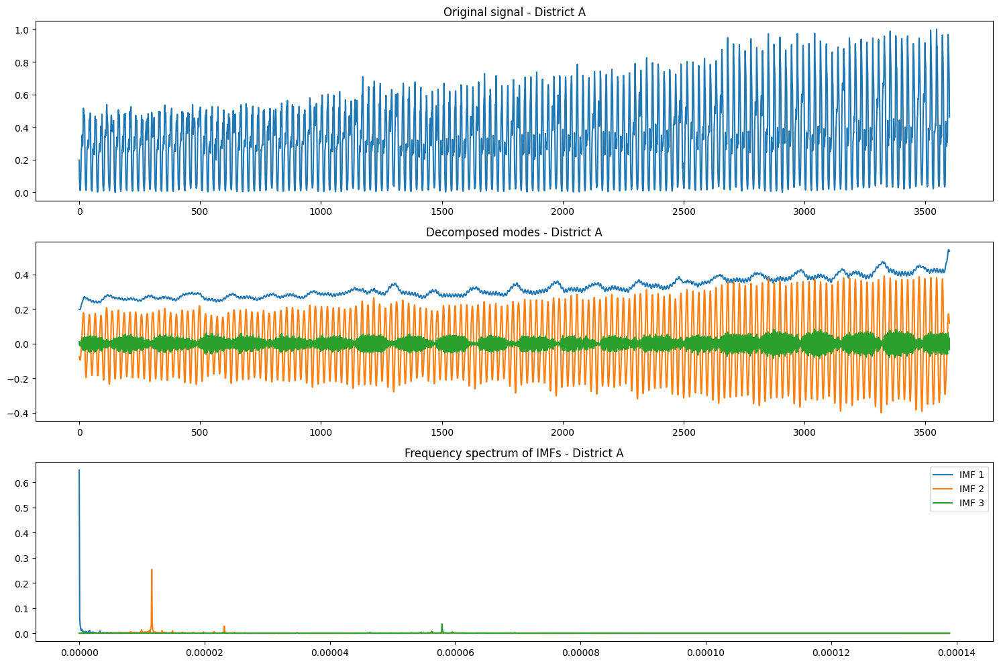

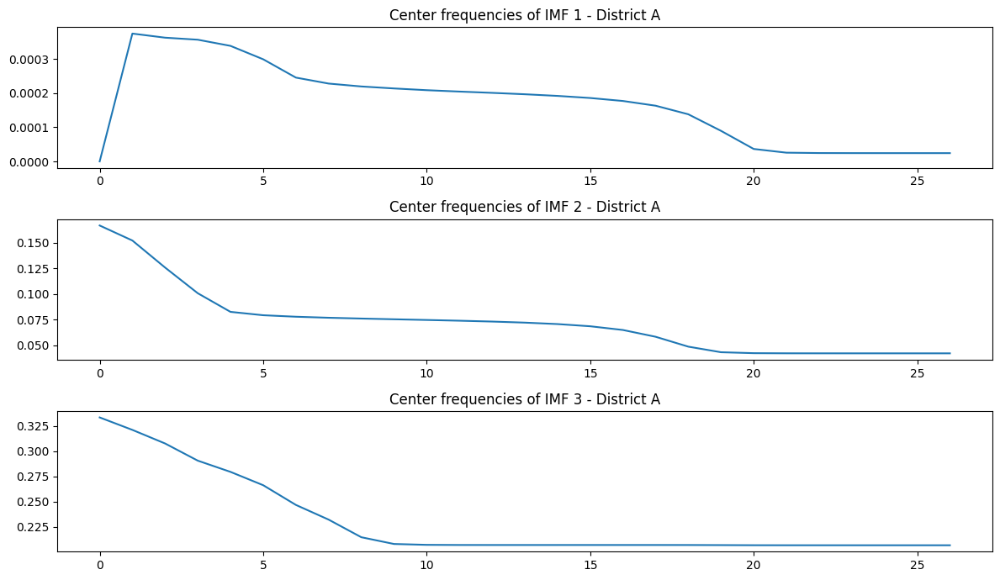

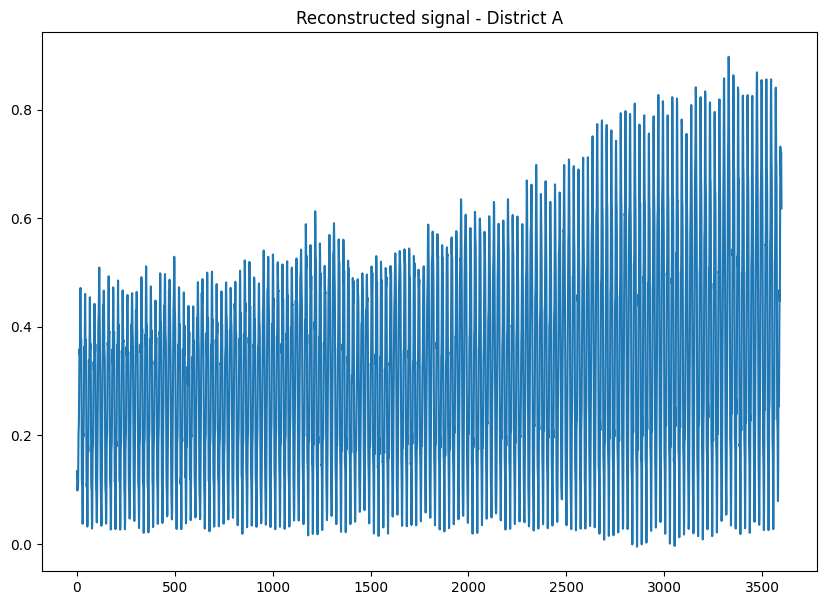

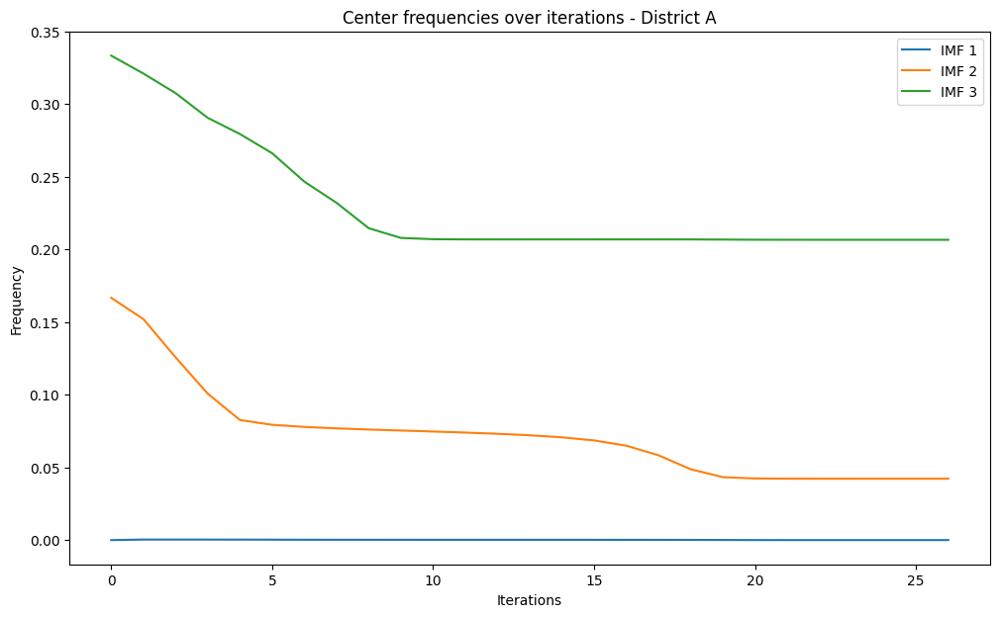

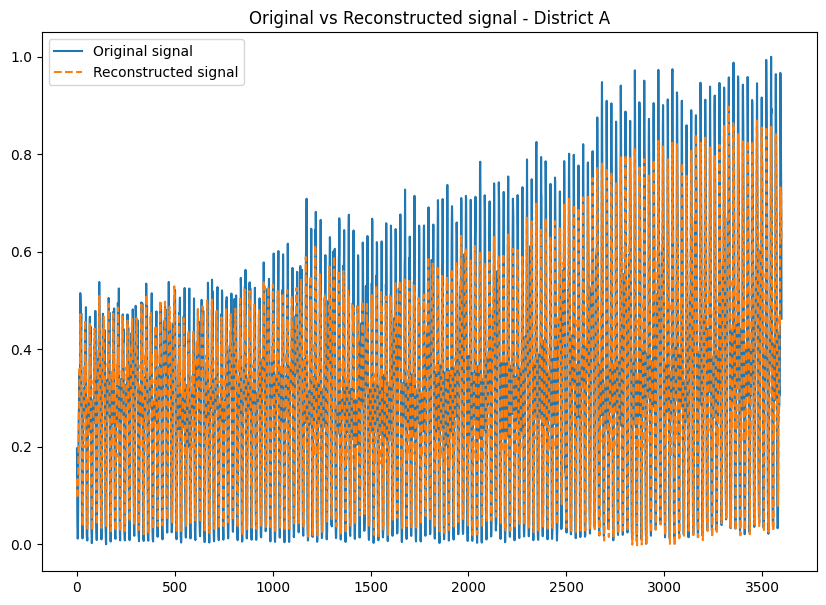

...

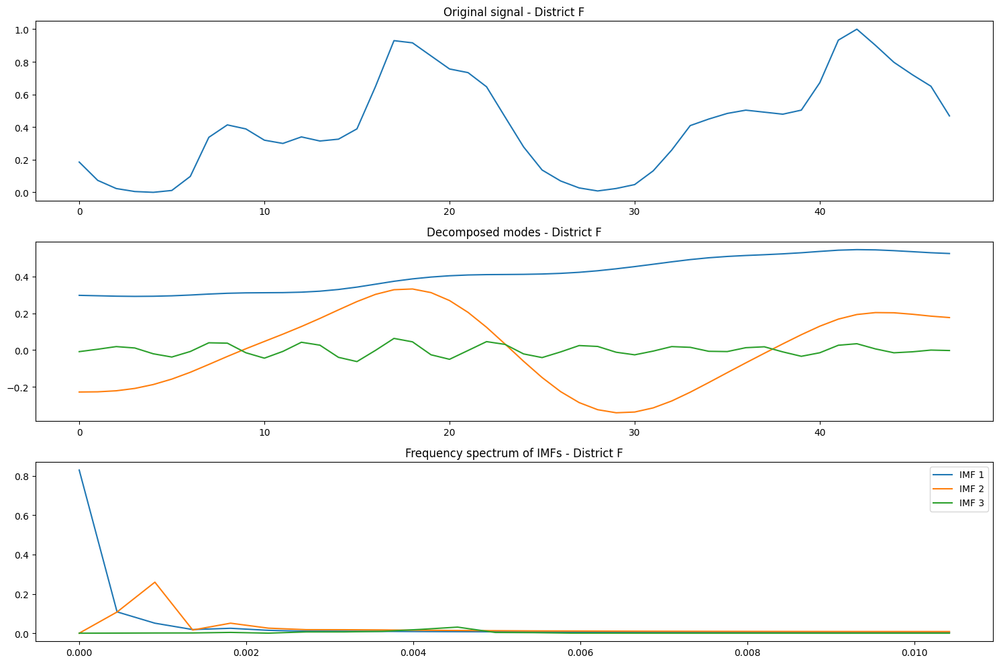

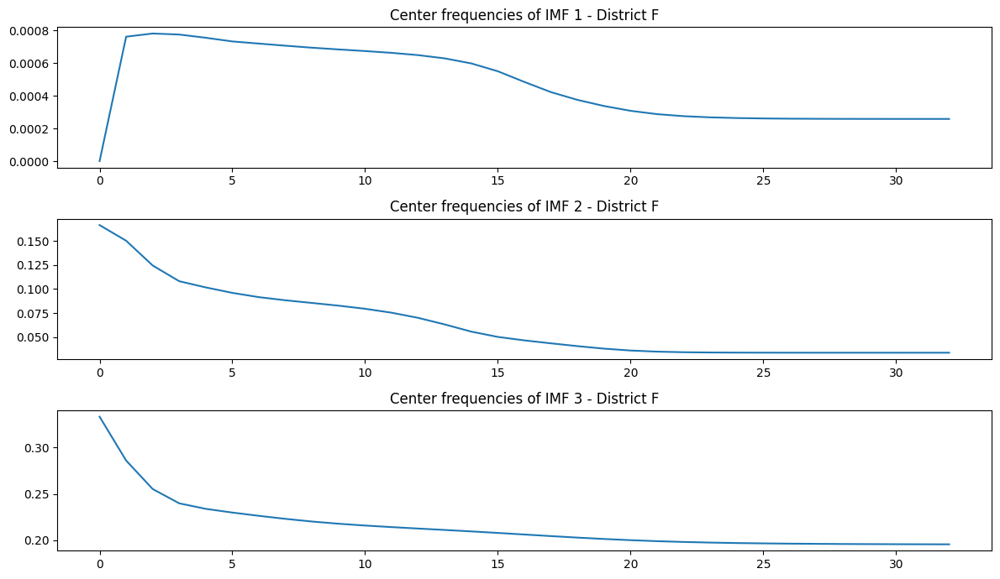

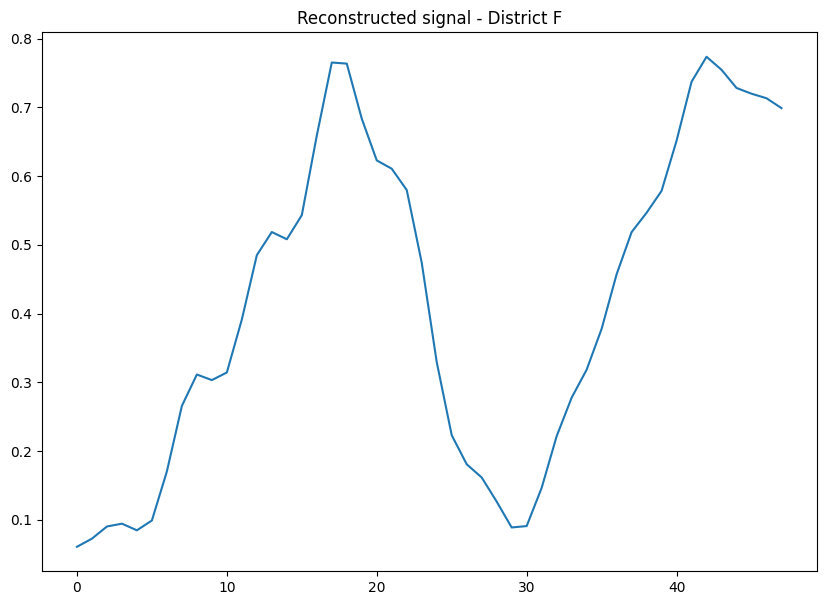

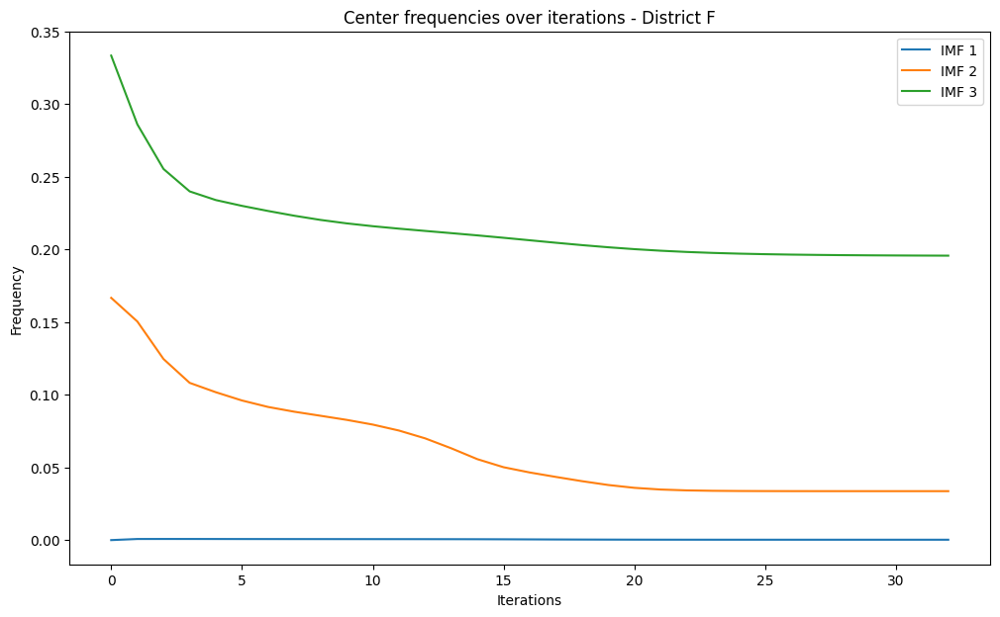

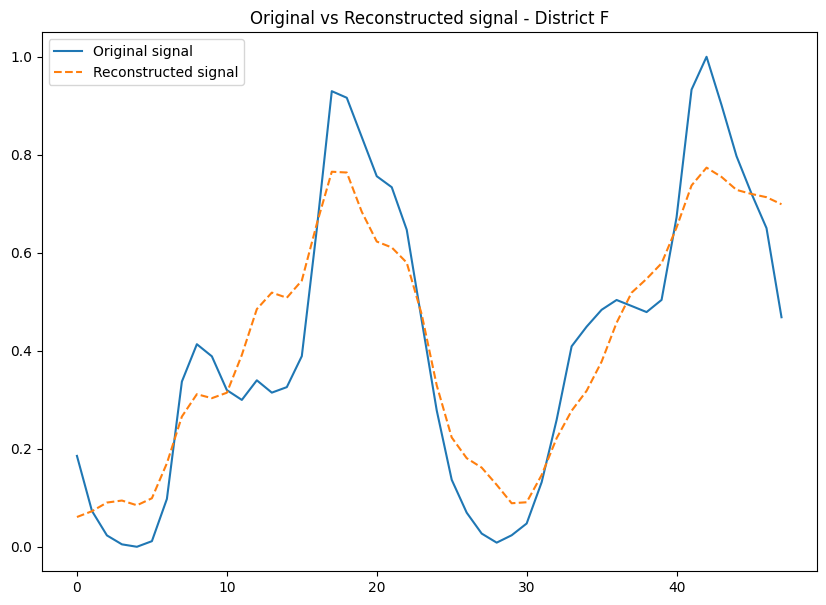

In [31]:
imfs1 = {}
for district,signal in load_all.items():
    u,u_hat,omega = apply_vmd(signal,district,3)
    imfs1[district] = u


In [33]:
from dtw import dtw
from scipy.spatial.distance import euclidean

dtw_distances = {}
for district in ['A', 'B', 'C', 'D', 'E']:
    dtw_distances[district] = []
    for k in range(3):
        a = np.array(imfs1[district][k]).reshape(-1,1)
        b = np.array(imfs1['F'][k]).reshape(-1,1)
        d, cost_matrix, acc_cost_matrix, path = dtw(a, b,dist=euclidean)
        dtw_distances[district].append(d)

df_distances = pd.DataFrame(dtw_distances, index=[f'IMF{i+1}' for i in range(3)])
print(df_distances) 
all_dtw_distance = {}
for district in dtw_distances:
    a_dtw_distance = 0 
    for k in range(3):
        distance = dtw_distances[district][k]
        a_dtw_distance += distance
    all_dtw_distance[district] = a_dtw_distance
print(all_dtw_distance)
min_distance = min(all_dtw_distance.values())
min_district = min(all_dtw_distance, key=all_dtw_distance.get)
print(min_district)

               A           B           C           D           E
IMF1   57.018035   80.724622  147.984966   48.815644   62.261573
IMF2  580.180208  542.150565  326.989684  561.723419  554.274786
IMF3   89.742262   73.107834   80.026812   88.369211   81.134318
{'A': 726.9405046860903, 'B': 695.9830204039457, 'C': 555.0014617474444, 'D': 698.9082743039614, 'E': 697.6706781842283}
C


vmd-dtw A-E（24*2，）与F（24*2，） 不归一化，同时间段

In [ ]:
import numpy as np
import scipy.io as sio
import pandas as pd
from vmdpy import VMD

data = sio.loadmat('processed_data_dict.mat')
user_id = 0
exist_load = 5
load_data2 = {}
for district in districts:
    district_data2 = data[f'{district}_user_data']
    existing_load1 = np.array([user[exist_load] for user in district_data2])
    print(existing_load1.shape)
    load_data2[district]=existing_load1
load_data_time_series_2_days = {}
for district in districts:
    if district.startswith('__'):
            continue
    district_data2 = load_data2[district]
    l_data2 = np.array(district_data2)
    print(l_data2.shape)
    num_users, num_hours, num_days = l_data2.shape
    l_data2_tr_hours = np.zeros((num_users, num_hours * num_days))
    for i in range(num_users):
         for j in range(num_days):
            for k in range(num_hours):
                l_data2_tr_hours[i, j * num_hours + k] = l_data[i, k, j]
                load_data_time_series_2_days[district] = l_data2_tr_hours    
    l_data2_tr_hours = np.array(l_data2_tr_hours)
    print(l_data2_tr_hours.shape)
load_all_F2 = {}
for district in districts:
    loa2 = load_data_time_series_2_days[district]
    all_user_load2 = np.sum(loa2, axis=0)
    print(all_user_load2.shape)
    load_all_F2[district] = all_user_load2


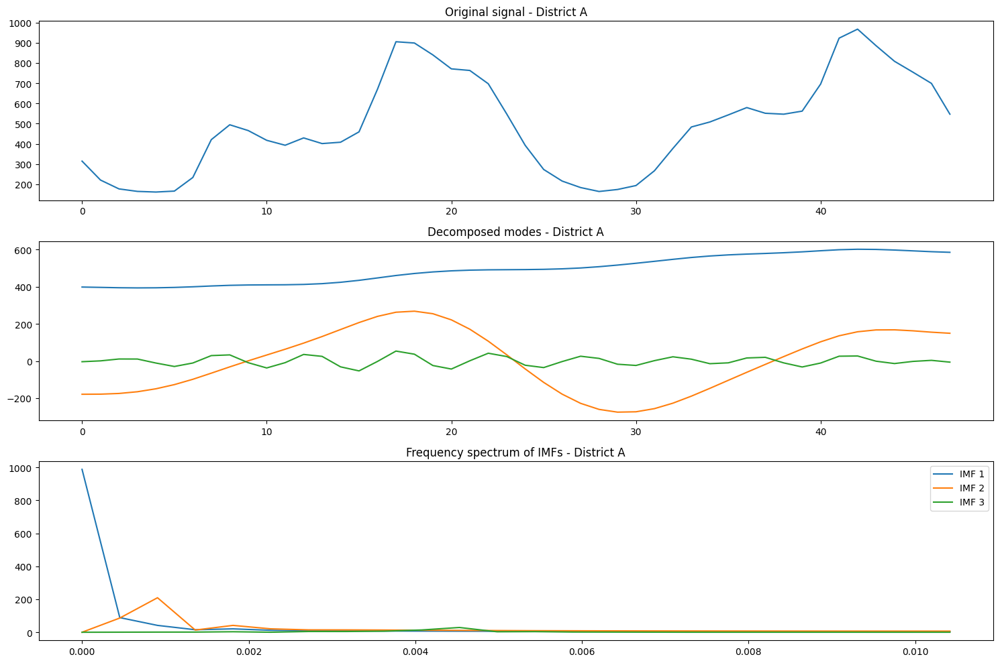

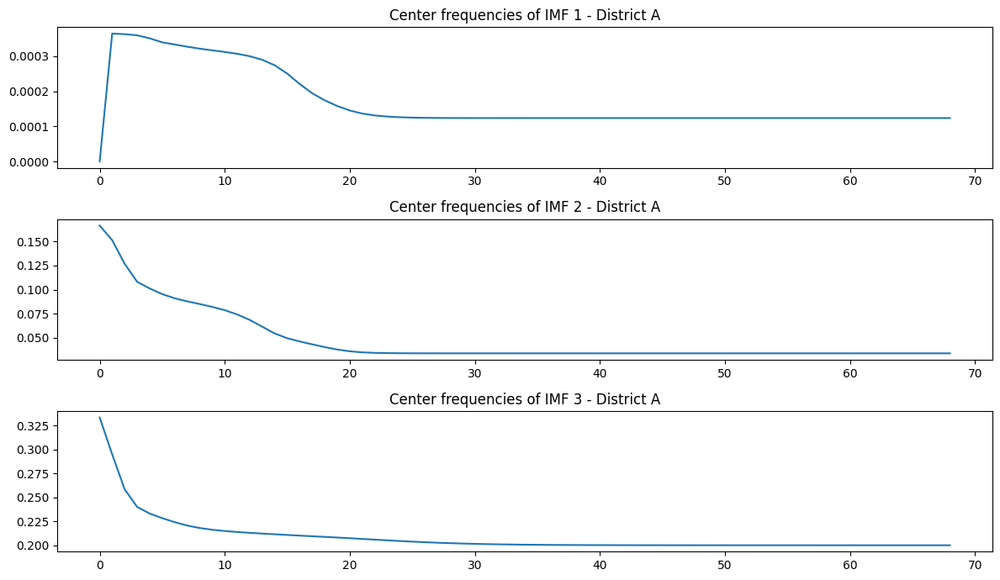

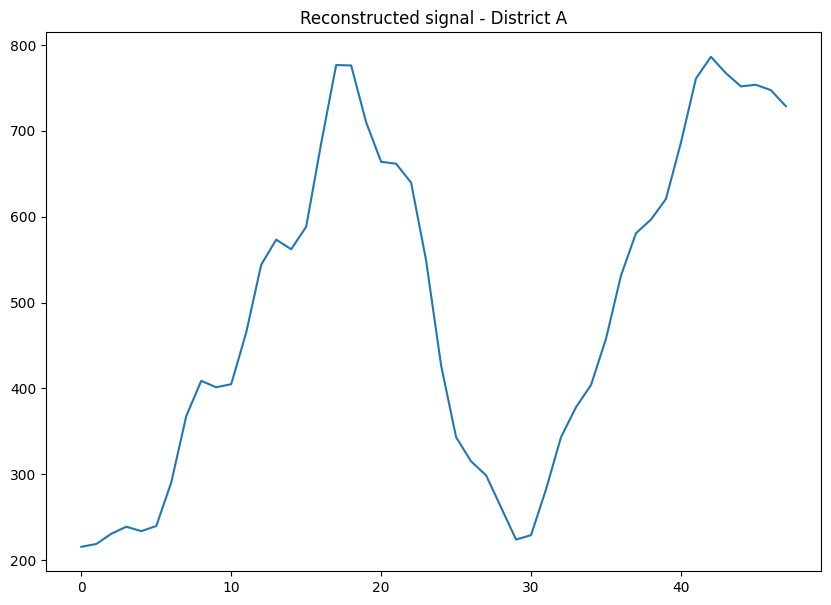

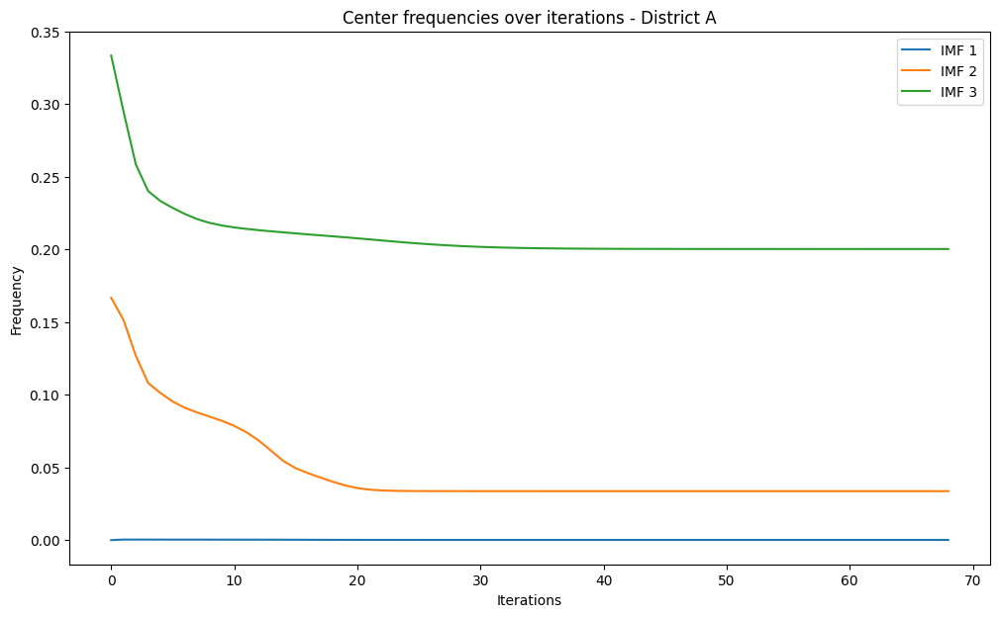

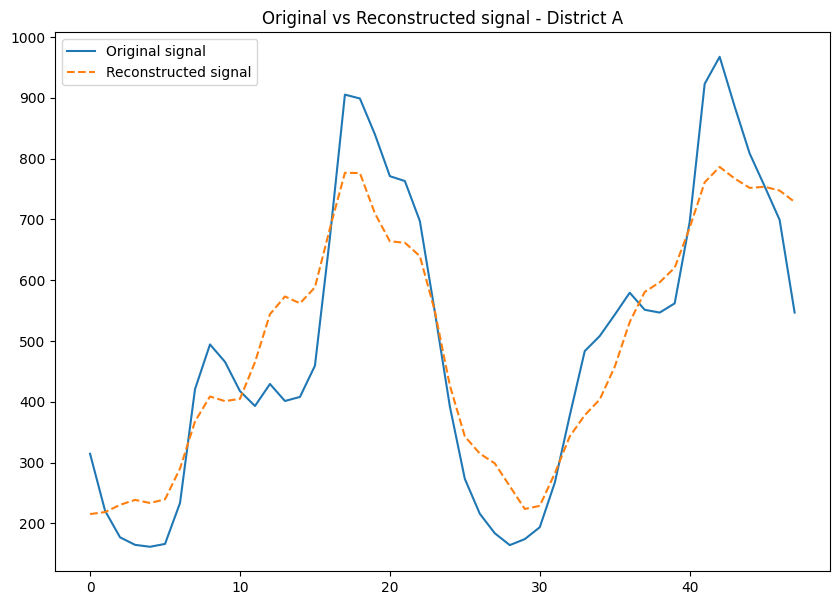

...

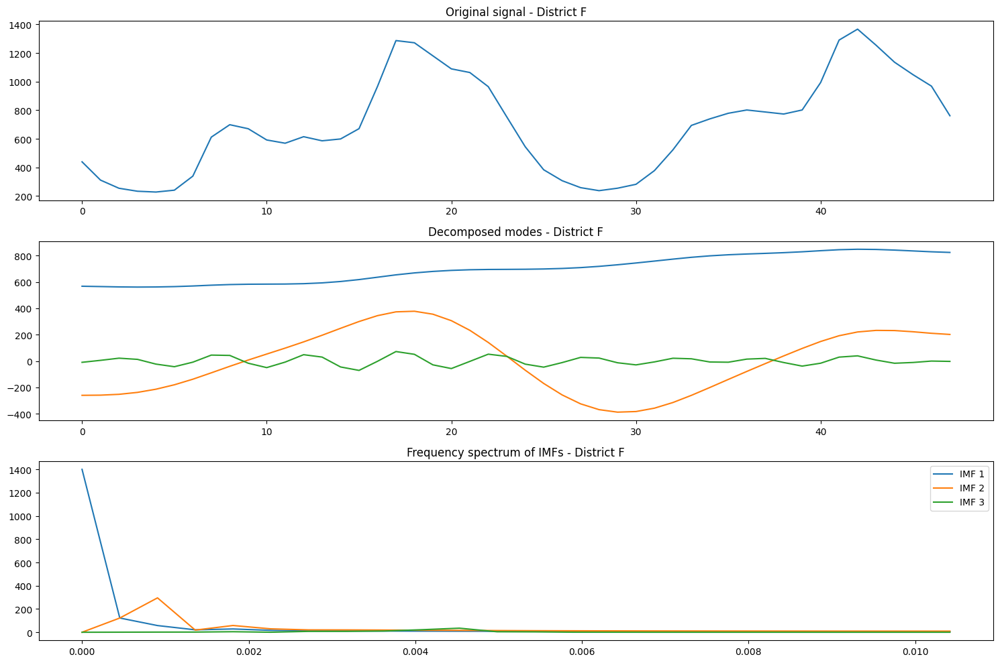

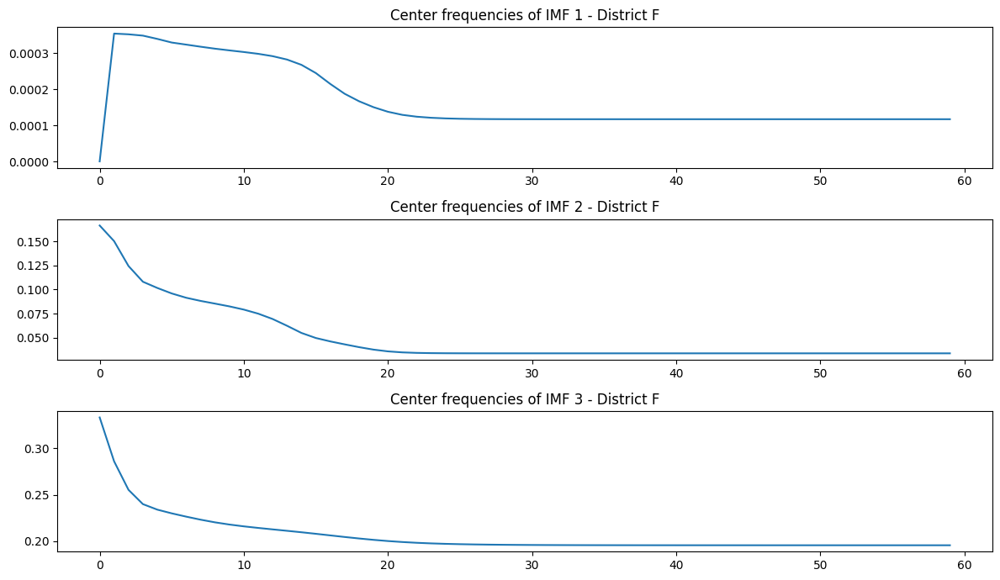

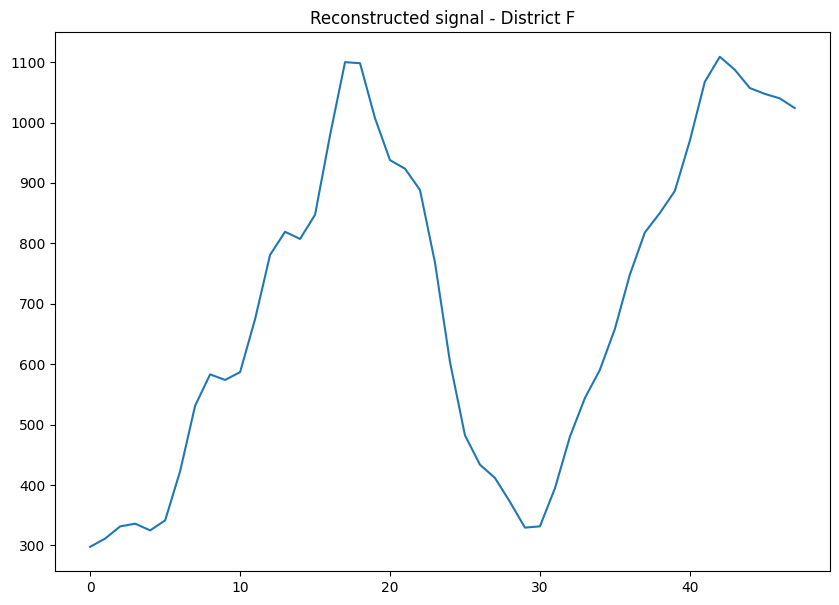

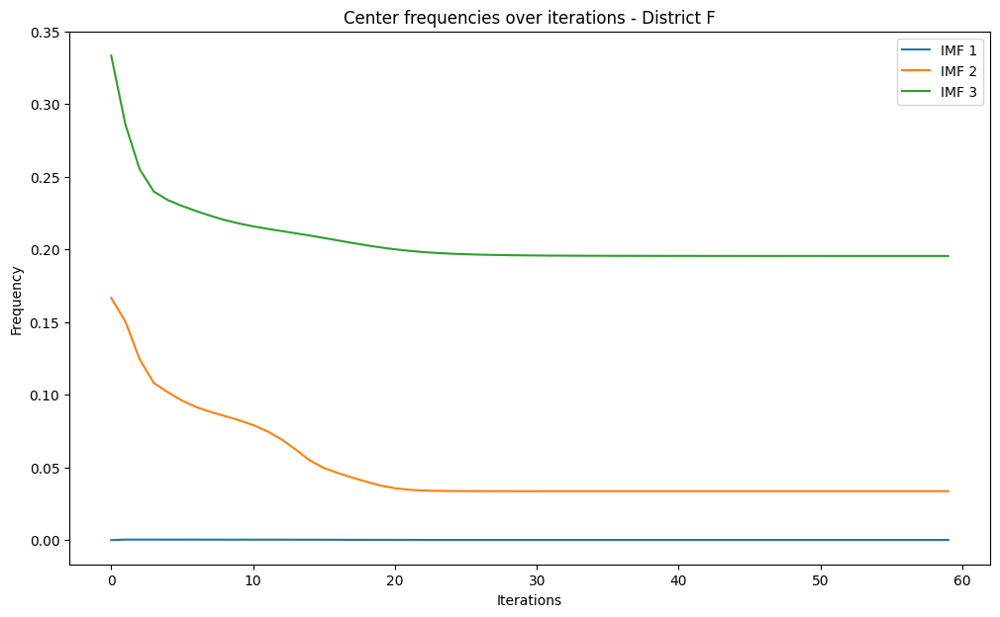

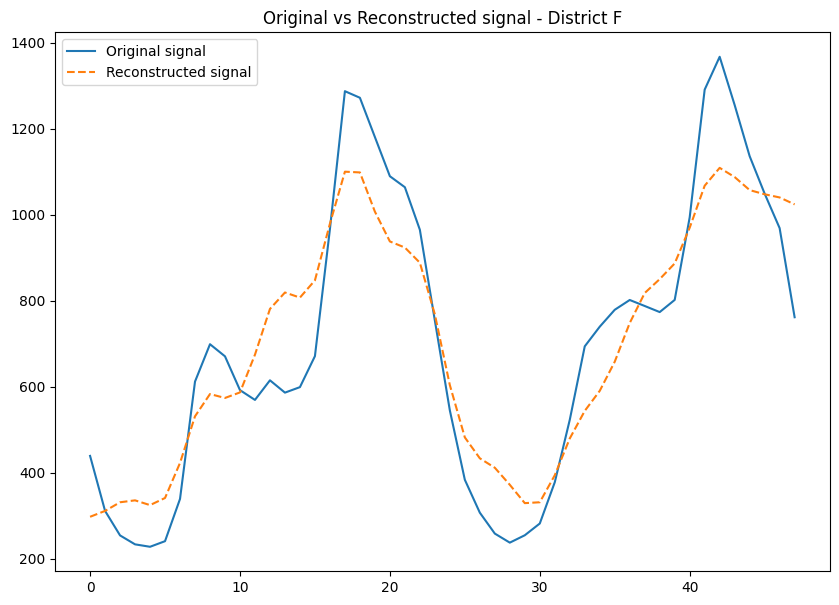

In [50]:
imfs2 = {}
for district,signal in load_all_F2.items():
    u,u_hat,omega = apply_vmd(signal,district,3)
    imfs2[district] = u

In [51]:
from dtw import dtw
from scipy.spatial.distance import euclidean

dtw_distances = {}
for district in ['A', 'B', 'C', 'D', 'E']:
    dtw_distances[district] = []
    for k in range(3):
        a = np.array(imfs2[district][k]).reshape(-1,1)
        b = np.array(imfs2['F'][k]).reshape(-1,1)
        d, cost_matrix, acc_cost_matrix, path = dtw(a, b,dist=euclidean)
        dtw_distances[district].append(d)

df_distances = pd.DataFrame(dtw_distances, index=[f'IMF{i+1}' for i in range(3)])
print(df_distances) 
all_dtw_distance = {}
for district in dtw_distances:
    a_dtw_distance = 0 
    for k in range(3):
        distance = dtw_distances[district][k]
        a_dtw_distance += distance
    all_dtw_distance[district] = a_dtw_distance
print(all_dtw_distance)
min_distance = min(all_dtw_distance.values())
min_district = min(all_dtw_distance, key=all_dtw_distance.get)
print(min_district)

                A             B             C            D             E
IMF1  8763.071427  17739.569308  14035.209993  8861.228121  28019.170062
IMF2  2198.053493   4319.681583   3206.342464  2201.318197   7980.856391
IMF3   344.672952    588.913808    467.056718   339.968132   1077.735125
{'A': 11305.797871223658, 'B': 22648.164698303346, 'C': 17708.609174973404, 'D': 11402.514450160501, 'E': 37077.76157826875}
A


vmd-dtw A-E（24*2，）与F（24*2，） 归一化，同时间段

In [52]:
for district in load_all_F2:
    data2 = load_all_F2[district]
    min_val = np.min(data2)
    max_val = np.max(data2)
    normalized_data = (data2 - min_val) / (max_val - min_val)
    load_all_F2[district] = normalized_data 

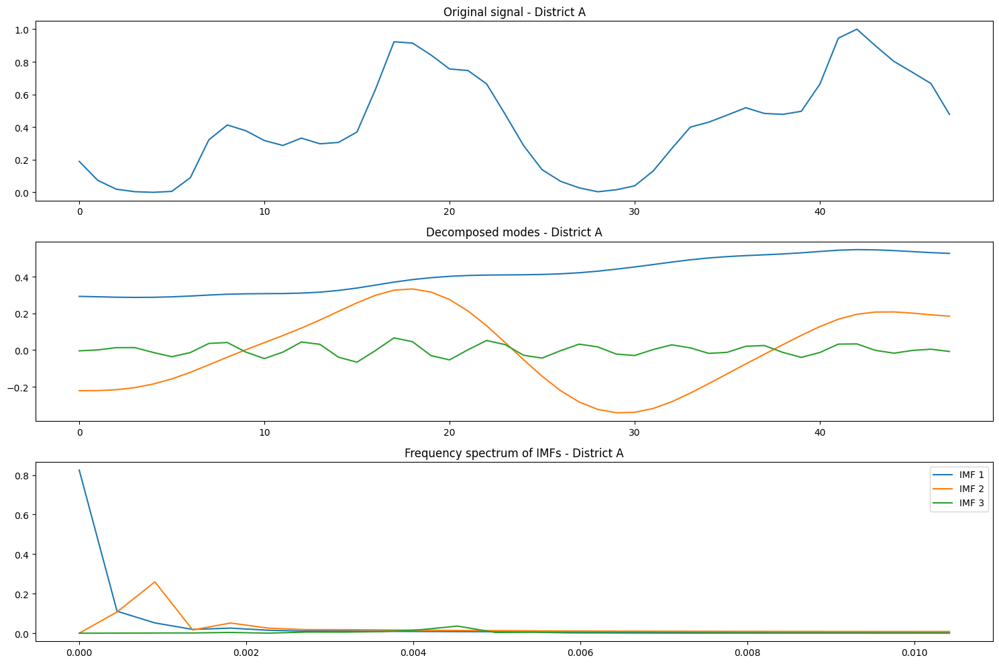

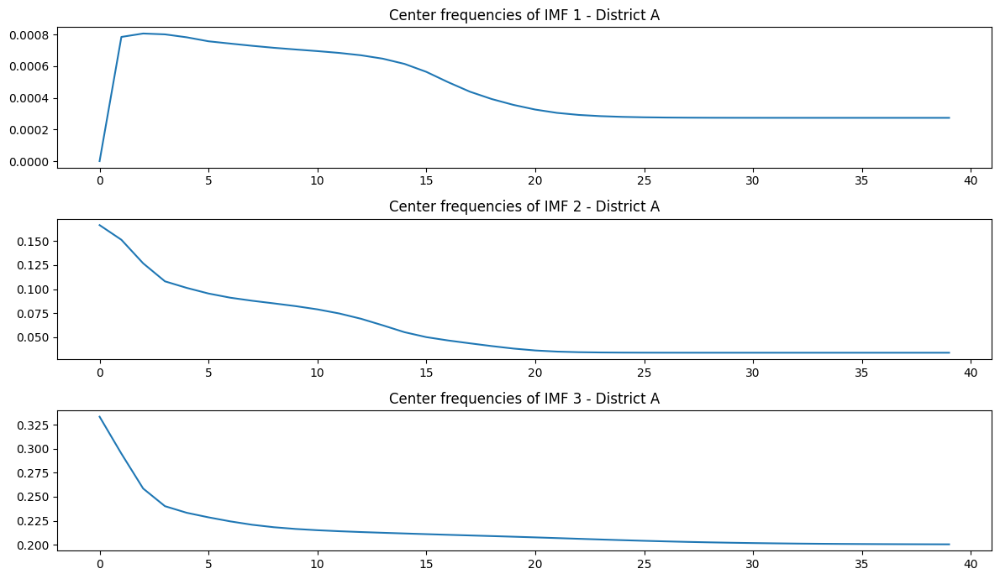

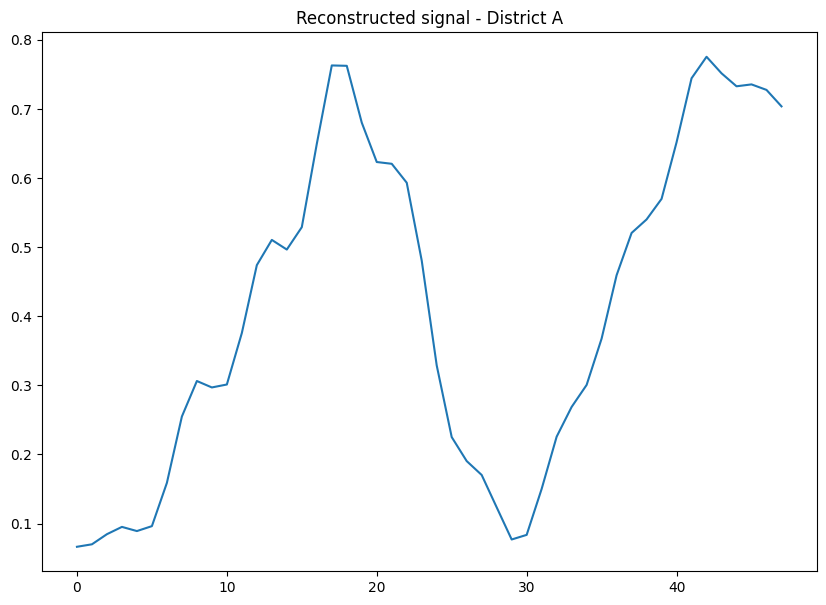

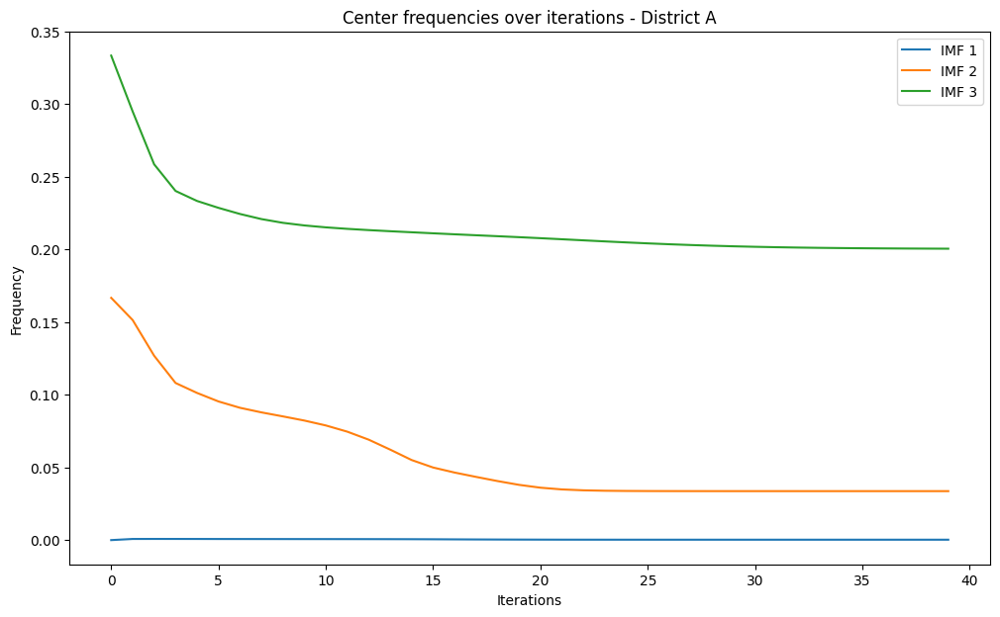

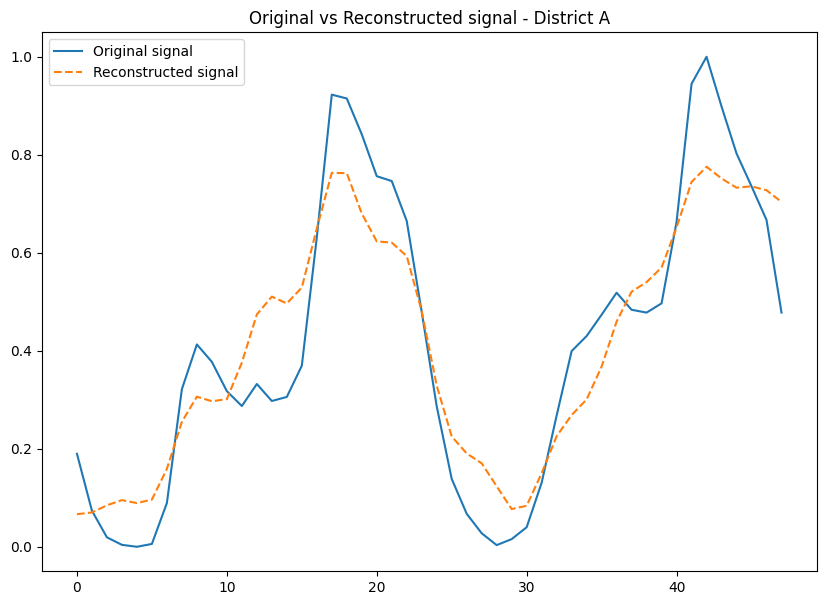

...

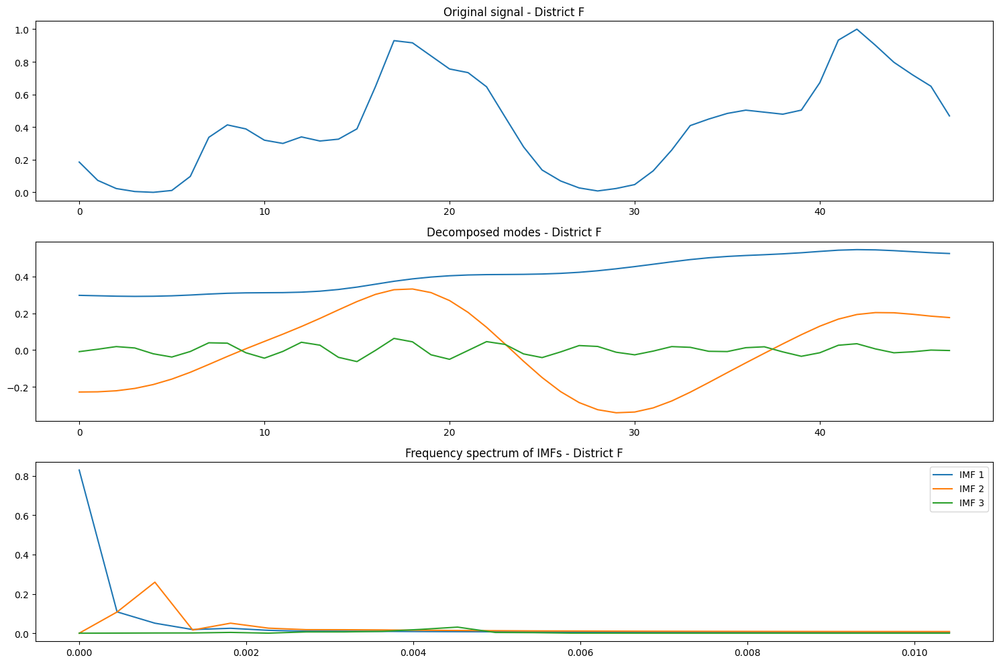

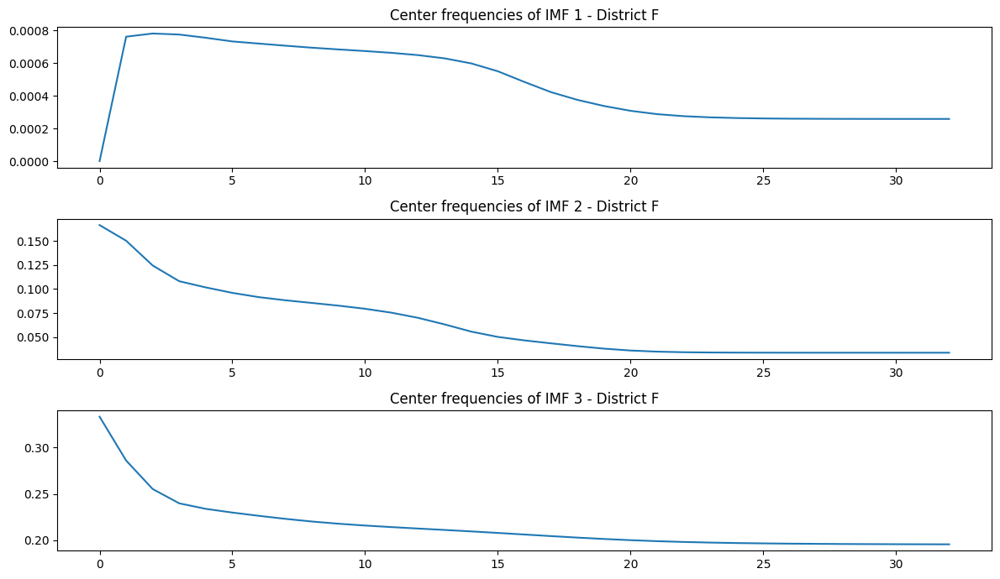

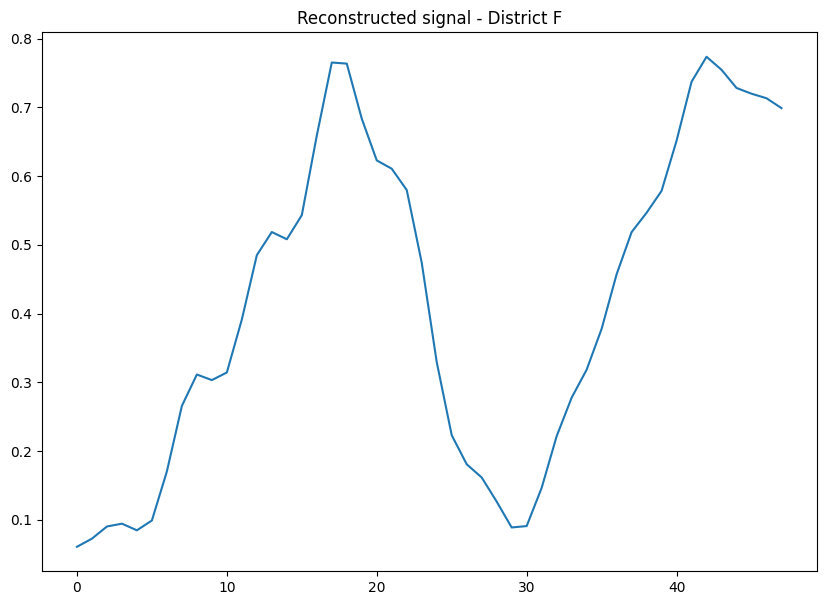

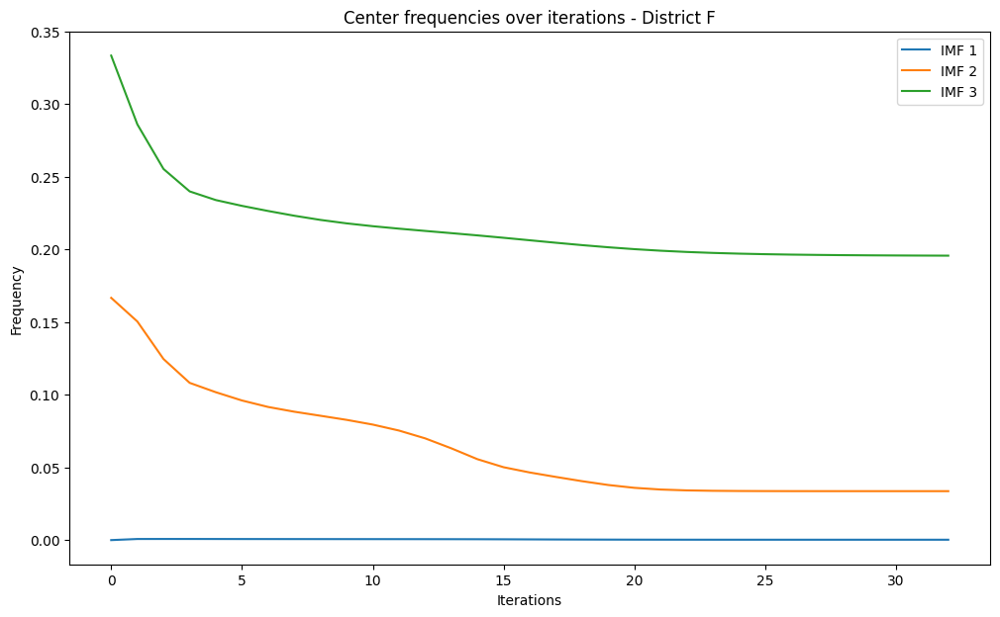

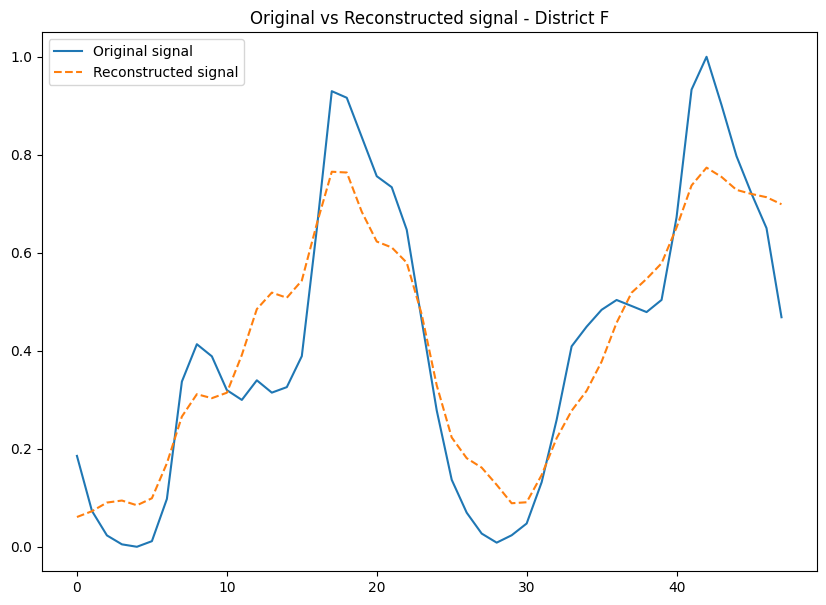

In [55]:
imfs3 = {}
for district,signal in load_all_F2.items():
    u,u_hat,omega = apply_vmd(signal,district,3)
    imfs3[district] = u

In [56]:
from dtw import dtw
from scipy.spatial.distance import euclidean

dtw_distances = {}
for district in ['A', 'B', 'C', 'D', 'E']:
    dtw_distances[district] = []
    for k in range(3):
        a = np.array(imfs3[district][k]).reshape(-1,1)
        b = np.array(imfs3['F'][k]).reshape(-1,1)
        d, cost_matrix, acc_cost_matrix, path = dtw(a, b,dist=euclidean)
        dtw_distances[district].append(d)

df_distances = pd.DataFrame(dtw_distances, index=[f'IMF{i+1}' for i in range(3)])
print(df_distances) 
all_dtw_distance = {}
for district in dtw_distances:
    a_dtw_distance = 0 
    for k in range(3):
        distance = dtw_distances[district][k]
        a_dtw_distance += distance
    all_dtw_distance[district] = a_dtw_distance
print(all_dtw_distance)
min_distance = min(all_dtw_distance.values())
min_district = min(all_dtw_distance, key=all_dtw_distance.get)
print(min_district)

             A         B         C         D         E
IMF1  0.092384  0.187782  0.219483  0.097189  0.304942
IMF2  0.220762  0.305606  0.170299  0.213125  0.538200
IMF3  0.218692  0.174610  0.118324  0.204333  3.154013
{'A': 0.5318385057211727, 'B': 0.6679979110884593, 'C': 0.5081056024864212, 'D': 0.5146469056959726, 'E': 3.9971551778743413}
C


vmd-dtw A-E（24，）TLC与F（24*2，）RLC（用户数的维度均用mean去掉） 归一化

In [66]:
import numpy as np
import scipy.io as sio
import pandas as pd
from vmdpy import VMD

data = sio.loadmat('processed_data_dict.mat')
user_id = 0
past_load = 2,3,4
exist_load = 5
print(data['A_user_data'].shape)
print(data['A_user_data'][0][exist_load].shape)
for col in past_load:
    print(data['A_user_data'][0][col].shape)
districts = ['A','B','C','D','E','F']    

#对A-F，把（用户数，小时数，天数）变成（用户数，小时数）->np.mean
#对A-F，把（用户数，小时数）变成（小时数，），即对A-F，构造24h的居民负荷时间序列 ->np.mean
load_data = {}
load_mean = {}
for district in districts:
    district_data = data[f'{district}_user_data']
    user_ids = np.array(district_data[:, user_id], dtype=int)
    if district in ['A','B','C','D','E']:
        load_list = []
        for col in past_load:
            load = np.array([user[col] for user in district_data])
            load_list.append(load)
        history_load_district = np.concatenate(load_list,axis=2)
        print(history_load_district.shape)
        load_data[district]=history_load_district
    elif district in ['F']:
        existing_load = np.array([user[exist_load] for user in district_data])
        print(existing_load.shape)
        load_data[district]=existing_load
for district,load in load_data.items():
    if district in ['A','B','C','D','E']:
        load_days_mean = np.mean(load,axis=2)
        print(load_days_mean.shape)
        load_users_mean = np.mean(load_days_mean,axis=0)
        print(load_users_mean.shape)
        load_mean[district] = load_users_mean
    if district in ['F']:
        load_mean_F = []
        load_users_mean = np.mean(load,axis=0)
        print(load_users_mean.shape)
        num_hours,num_days = load_users_mean.shape
        for i in range(num_days):
            for j in range(num_hours):
                load_mean_F.append(load_users_mean[j,i]) 
        load_mean_F = np.array(load_mean_F)
        print(load_mean_F.shape)
        load_mean[district] = load_mean_F
print(load_mean)    
        

(711, 7)
(24, 2)
(24, 120)
(24, 15)
(24, 15)
(711, 24, 150)
(473, 24, 150)
(584, 24, 150)
(708, 24, 150)
(174, 24, 150)
(1000, 24, 2)
(711, 24)
(24,)
(473, 24)
(24,)
(584, 24)
(24,)
(708, 24)
(24,)
(174, 24)
(24,)
(24, 2)
(48,)
{'A': array([0.48685414, 0.35166977, 0.28972724, 0.26424544, 0.25392827,
       0.26706118, 0.32774122, 0.48713028, 0.60044093, 0.61445647,
       0.63862301, 0.65350875, 0.70793713, 0.71073701, 0.66676789,
       0.69038356, 0.80946404, 1.02180235, 1.07612176, 1.04451503,
       1.03752592, 1.02180002, 0.92058235, 0.71405714]), 'B': array([0.30641447, 0.22467669, 0.18806161, 0.17126802, 0.16498519,
       0.18268622, 0.21796252, 0.31044333, 0.36526366, 0.39230918,
       0.40906233, 0.41640308, 0.4430266 , 0.44881456, 0.4201558 ,
       0.42979699, 0.49830997, 0.64187345, 0.71171148, 0.70066467,
       0.68829116, 0.67060603, 0.59209975, 0.45090192]), 'C': array([0.37727087, 0.26265289, 0.21252119, 0.19249054, 0.18816498,
       0.20040275, 0.25298349, 0.375867

C:\Users\29623\AppData\Local\Temp\ipykernel_16164\2724744893.py:22: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  user_ids = np.array(district_data[:, user_id], dtype=int)


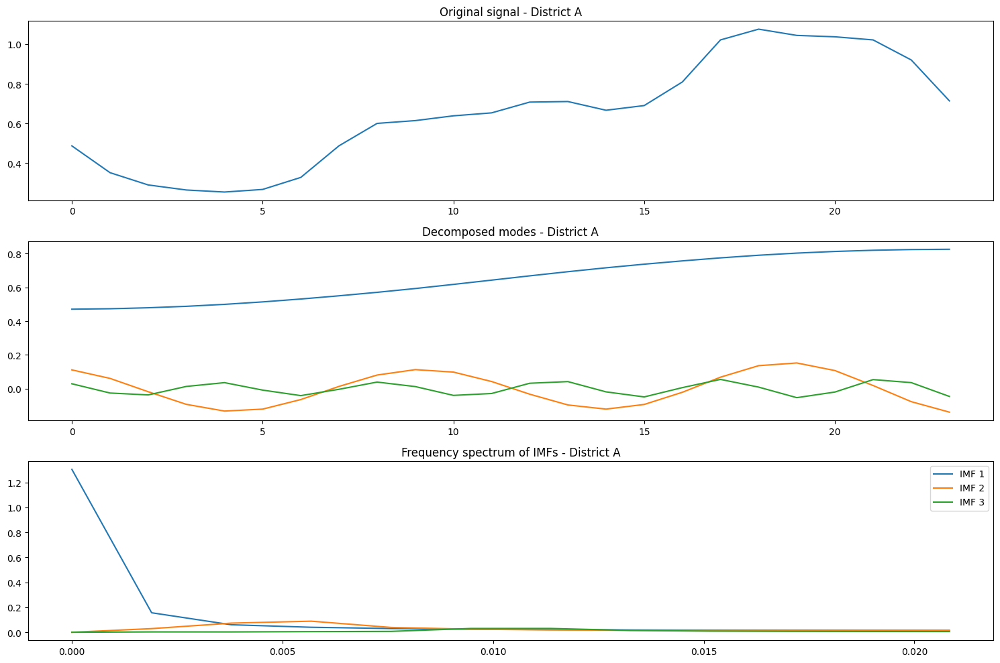

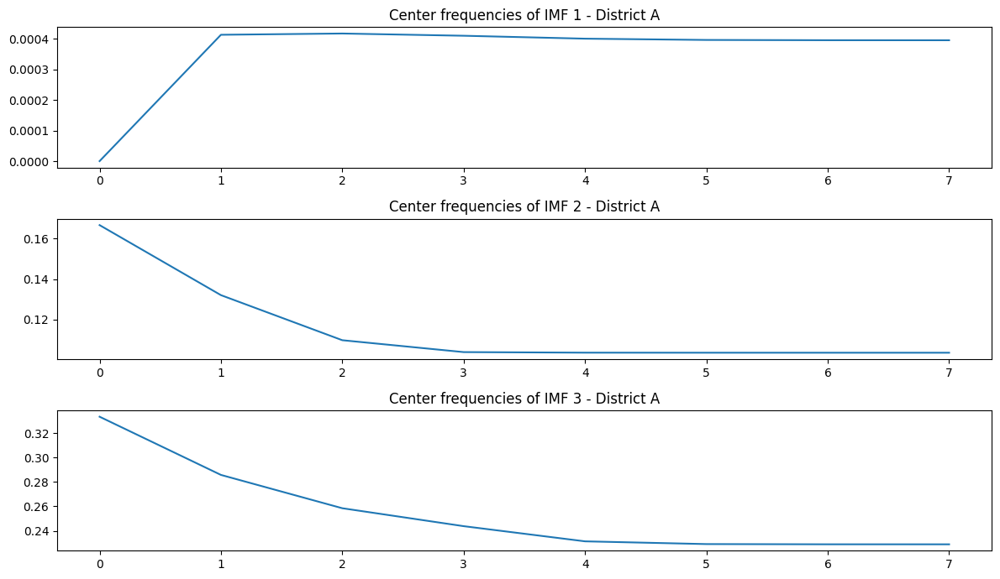

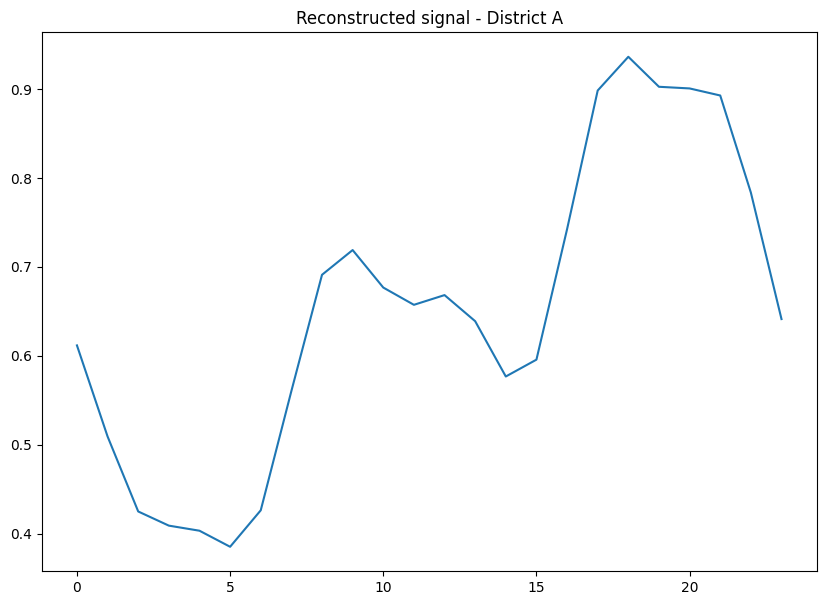

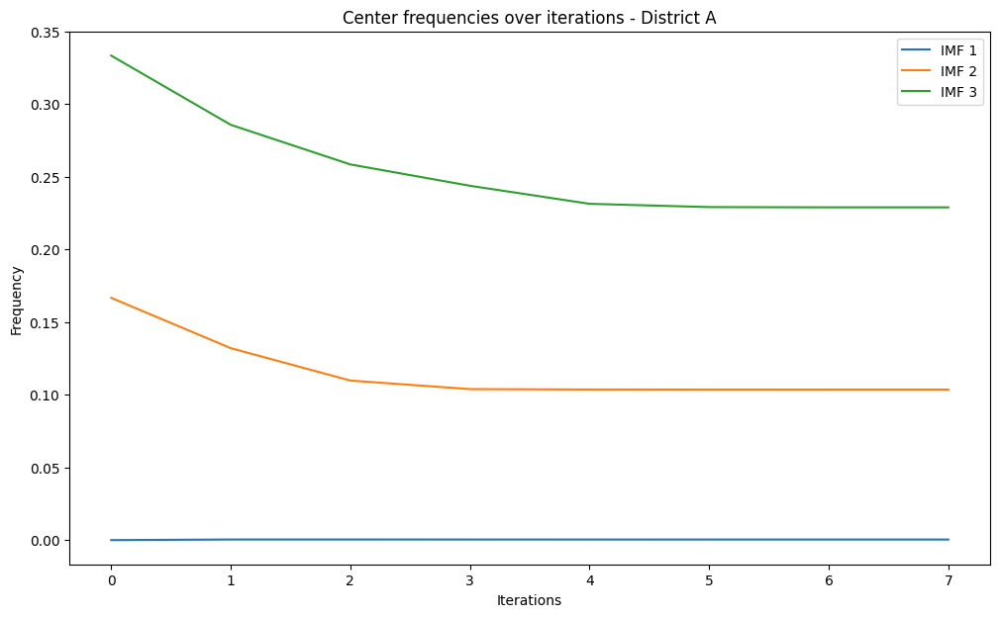

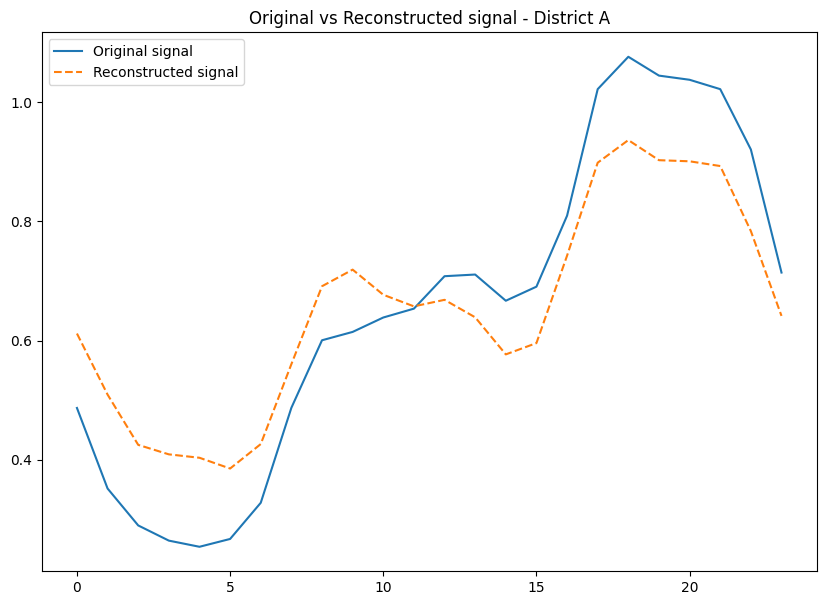

...

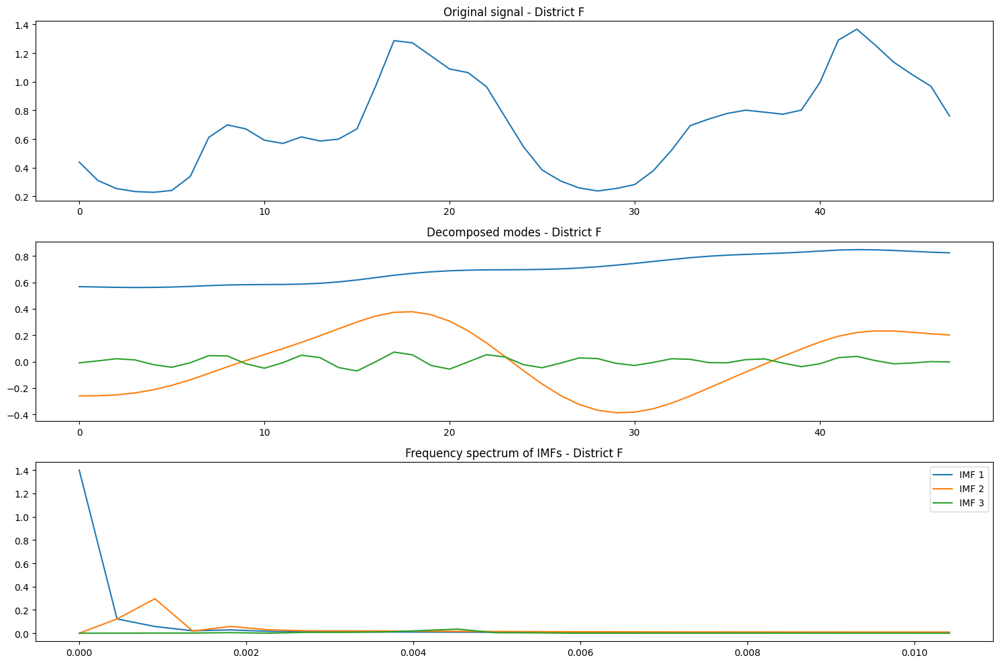

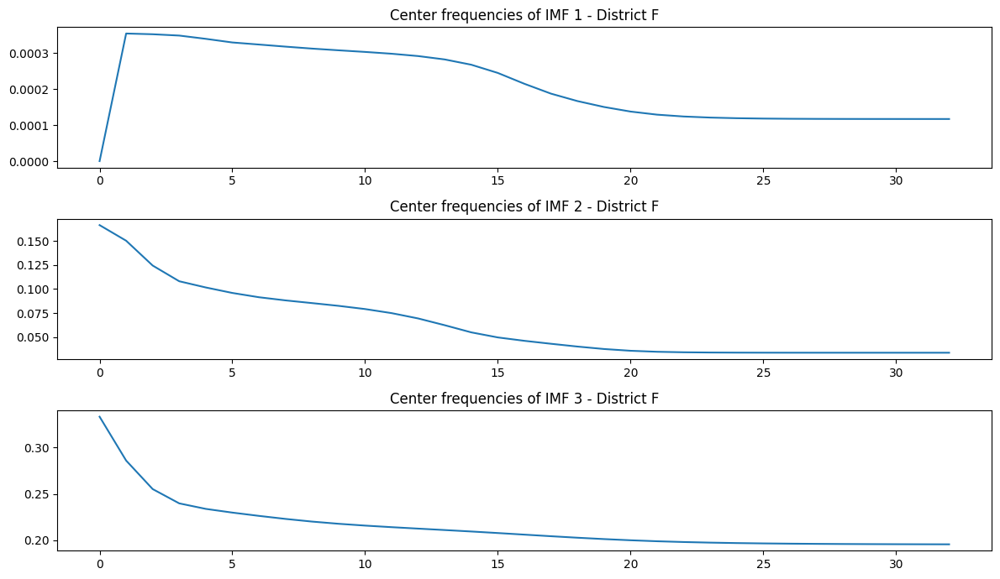

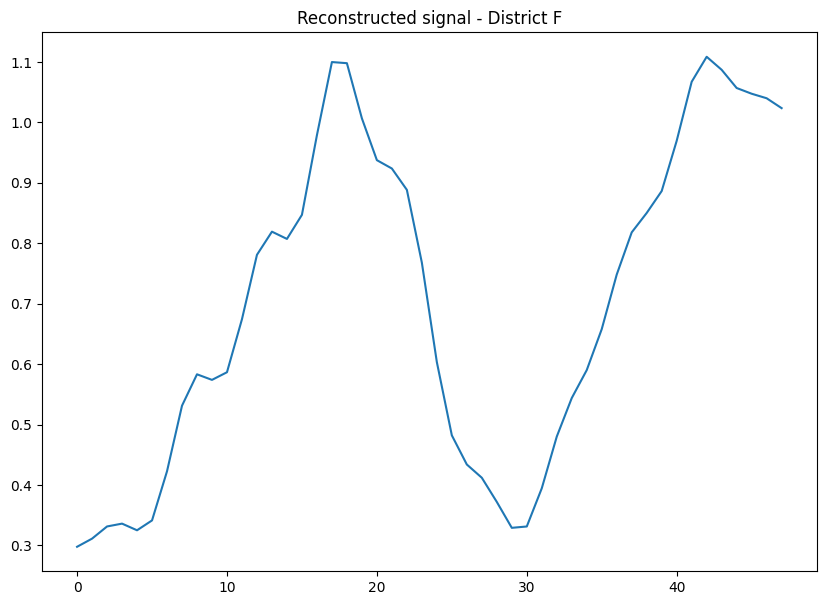

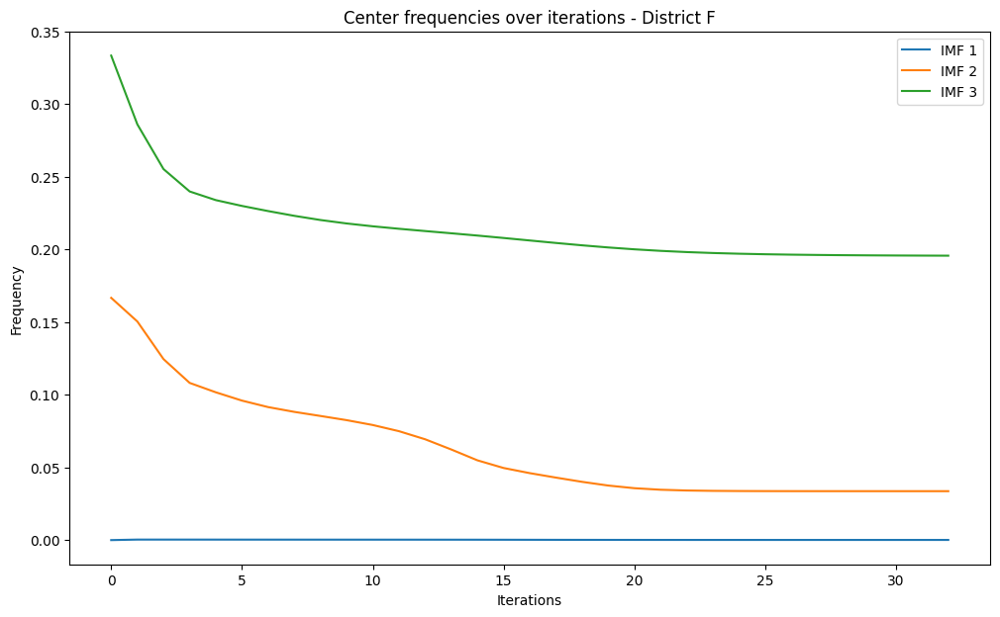

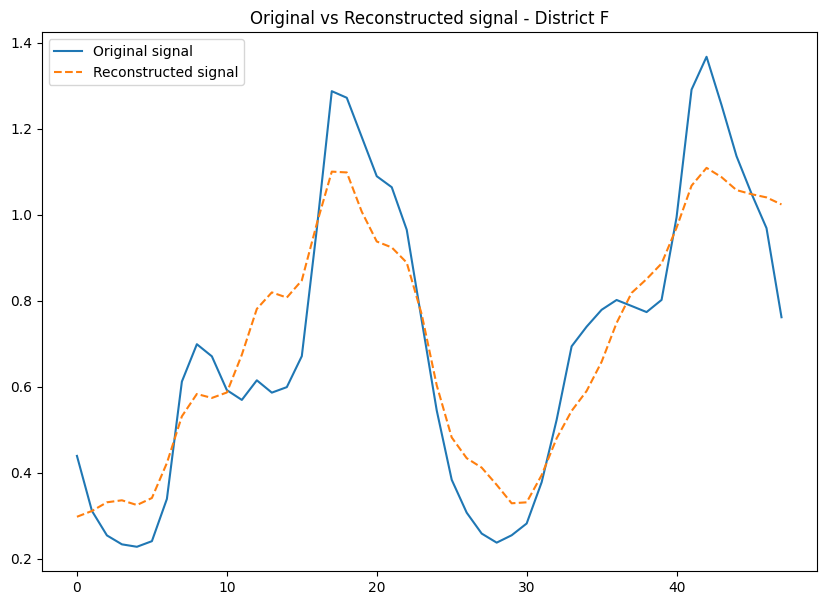

In [67]:
imfs4 = {}
for district,signal in load_mean.items():
    u,u_hat,omega = apply_vmd(signal,district,3)
    imfs4[district] = u

In [68]:
from dtw import dtw
from scipy.spatial.distance import euclidean

dtw_distances = {}
for district in ['A', 'B', 'C', 'D', 'E']:
    dtw_distances[district] = []
    for k in range(3):
        a = np.array(imfs4[district][k]).reshape(-1,1)
        b = np.array(imfs4['F'][k]).reshape(-1,1)
        d, cost_matrix, acc_cost_matrix, path = dtw(a, b,dist=euclidean)
        dtw_distances[district].append(d)

df_distances = pd.DataFrame(dtw_distances, index=[f'IMF{i+1}' for i in range(3)])
print(df_distances) 
all_dtw_distance = {}
for district in dtw_distances:
    a_dtw_distance = 0 
    for k in range(3):
        distance = dtw_distances[district][k]
        a_dtw_distance += distance
    all_dtw_distance[district] = a_dtw_distance
print(all_dtw_distance)
min_distance = min(all_dtw_distance.values())
min_district = min(all_dtw_distance, key=all_dtw_distance.get)
print(min_district)

             A          B         C          D         E
IMF1  0.780012  10.774606  6.497488  13.113033  5.042559
IMF2  6.243140   7.187238  6.694892   7.517642  6.606925
IMF3  0.885453   0.898956  0.903121   0.881952  0.880110
{'A': 7.908605436503964, 'B': 18.86080049975624, 'C': 14.095501513183894, 'D': 21.51262768684473, 'E': 12.529593990895398}
A
